In [76]:
import numpy as np
import pandas as pd
import os
import math
import random 
import cv2 as cv

from scipy import stats #Analysis 
from scipy.stats import norm 

import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

1. Data Load
치매 예방을 위한 라이프로그 치매 분류

9,327 rows × 2 columns x 5 picture

For more details https://aihub.or.kr/problem_contest/nipa-learning-platform/6

In [77]:
# original data : data 

path = "./Dataset/pic_dataset"

FAST_RUN = False
IMAGE_WIDTH=34
IMAGE_HEIGHT=34
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=1

filenames = os.listdir(path)
categories = []
sobee = []

# data = cv.imread('/content/gdrive/My Drive/CoLab/Dataset/pic_dataset/CN_0.png', 0)
# img = cv.resize(data, None, fx=28/349, fy=28/231)
# print(img/255)
# print(img.shape)

for filename in filenames:
    category = filename.split('_')[0]
    categories.append(category)
#    if category == 'CN':
#        categories.append(0)
#    elif  category == 'MCI':
#        categories.append(1)
#    else:
#        categories.append(2)

data = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

data

,filename,category
0,CN_0.png,CN
1,CN_1.png,CN
2,CN_10.png,CN
3,CN_1000.png,CN
4,CN_1001.png,CN
...,...,...
9322,MCI_95.png,MCI
9323,MCI_96.png,MCI
9324,MCI_97.png,MCI
9325,MCI_98.png,MCI


2. EDA
9,327 rows × 66 columns

148명에 대한 데일리 라이프로그 데이터
크게 1. 기본 정보 2. 걸음거리 3.수면 4.컨버팅 데이터로 나눌 수 있겠습니다.

4. converting

CONVERT(activity_class_5min USING utf8)
CONVERT(activity_met_1min USING utf8)
CONVERT(sleep_hr_5min USING utf8)
CONVERT(sleep_hypnogram_5min USING utf8)
CONVERT(sleep_rmssd_5min USING utf8)
y variable

DIAG_NM
정상(CN), 경도인지 장애(MCI), 치매(Dem)

In [78]:
data.shape

(9327, 2)

In [79]:
for i in range(len(filenames)):
  mypath = path + '/' + filenames[i]
  print(mypath)
  data = cv.imread(mypath, 0)
  img = cv.resize(data, None, fx=28/349, fy=28/231)
  img = img/255
  sobee.append(img)

./Dataset/pic_dataset/CN_0.png
./Dataset/pic_dataset/CN_1.png
./Dataset/pic_dataset/CN_10.png
./Dataset/pic_dataset/CN_1000.png
./Dataset/pic_dataset/CN_1001.png
./Dataset/pic_dataset/CN_1002.png
./Dataset/pic_dataset/CN_1003.png
./Dataset/pic_dataset/CN_1004.png
./Dataset/pic_dataset/CN_1005.png
./Dataset/pic_dataset/CN_1006.png
./Dataset/pic_dataset/CN_1007.png
./Dataset/pic_dataset/CN_1008.png
./Dataset/pic_dataset/CN_1009.png
./Dataset/pic_dataset/CN_1010.png
./Dataset/pic_dataset/CN_1011.png
./Dataset/pic_dataset/CN_1012.png
./Dataset/pic_dataset/CN_1013.png
./Dataset/pic_dataset/CN_1014.png
./Dataset/pic_dataset/CN_1015.png
./Dataset/pic_dataset/CN_1016.png
./Dataset/pic_dataset/CN_1017.png
./Dataset/pic_dataset/CN_1018.png
./Dataset/pic_dataset/CN_1019.png
./Dataset/pic_dataset/CN_1020.png
./Dataset/pic_dataset/CN_1021.png
./Dataset/pic_dataset/CN_1022.png
./Dataset/pic_dataset/CN_1023.png
./Dataset/pic_dataset/CN_1024.png
./Dataset/pic_dataset/CN_1025.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/CN_1852.png
./Dataset/pic_dataset/CN_1853.png
./Dataset/pic_dataset/CN_1854.png
./Dataset/pic_dataset/CN_1855.png
./Dataset/pic_dataset/CN_1856.png
./Dataset/pic_dataset/CN_1857.png
./Dataset/pic_dataset/CN_1858.png
./Dataset/pic_dataset/CN_1859.png
./Dataset/pic_dataset/CN_186.png
./Dataset/pic_dataset/CN_1860.png
./Dataset/pic_dataset/CN_1861.png
./Dataset/pic_dataset/CN_1862.png
./Dataset/pic_dataset/CN_1863.png
./Dataset/pic_dataset/CN_1864.png
./Dataset/pic_dataset/CN_1865.png
./Dataset/pic_dataset/CN_1866.png
./Dataset/pic_dataset/CN_1867.png
./Dataset/pic_dataset/CN_1868.png
./Dataset/pic_dataset/CN_1869.png
./Dataset/pic_dataset/CN_187.png
./Dataset/pic_dataset/CN_1870.png
./Dataset/pic_dataset/CN_1871.png
./Dataset/pic_dataset/CN_1872.png
./Dataset/pic_dataset/CN_1873.png
./Dataset/pic_dataset/CN_1874.png
./Dataset/pic_dataset/CN_1875.png
./Dataset/pic_dataset/CN_188.png
./Dataset/pic_dataset/CN_189.png
./Dataset/pic_dataset/CN_19.png
./Dataset/pic_datase

./Dataset/pic_dataset/CN_2445.png
./Dataset/pic_dataset/CN_2446.png
./Dataset/pic_dataset/CN_2447.png
./Dataset/pic_dataset/CN_2448.png
./Dataset/pic_dataset/CN_2449.png
./Dataset/pic_dataset/CN_2450.png
./Dataset/pic_dataset/CN_2451.png
./Dataset/pic_dataset/CN_2452.png
./Dataset/pic_dataset/CN_2453.png
./Dataset/pic_dataset/CN_2454.png
./Dataset/pic_dataset/CN_2455.png
./Dataset/pic_dataset/CN_2456.png
./Dataset/pic_dataset/CN_2457.png
./Dataset/pic_dataset/CN_2458.png
./Dataset/pic_dataset/CN_2459.png
./Dataset/pic_dataset/CN_2460.png
./Dataset/pic_dataset/CN_2461.png
./Dataset/pic_dataset/CN_2462.png
./Dataset/pic_dataset/CN_2463.png
./Dataset/pic_dataset/CN_2464.png
./Dataset/pic_dataset/CN_2465.png
./Dataset/pic_dataset/CN_2466.png
./Dataset/pic_dataset/CN_2467.png
./Dataset/pic_dataset/CN_2468.png
./Dataset/pic_dataset/CN_2469.png
./Dataset/pic_dataset/CN_2470.png
./Dataset/pic_dataset/CN_2471.png
./Dataset/pic_dataset/CN_2472.png
./Dataset/pic_dataset/CN_2473.png
./Dataset/pic_

./Dataset/pic_dataset/CN_2844.png
./Dataset/pic_dataset/CN_2845.png
./Dataset/pic_dataset/CN_2846.png
./Dataset/pic_dataset/CN_2847.png
./Dataset/pic_dataset/CN_2848.png
./Dataset/pic_dataset/CN_2849.png
./Dataset/pic_dataset/CN_285.png
./Dataset/pic_dataset/CN_2850.png
./Dataset/pic_dataset/CN_2851.png
./Dataset/pic_dataset/CN_2852.png
./Dataset/pic_dataset/CN_2853.png
./Dataset/pic_dataset/CN_2854.png
./Dataset/pic_dataset/CN_2855.png
./Dataset/pic_dataset/CN_2856.png
./Dataset/pic_dataset/CN_2857.png
./Dataset/pic_dataset/CN_2858.png
./Dataset/pic_dataset/CN_2859.png
./Dataset/pic_dataset/CN_286.png
./Dataset/pic_dataset/CN_2860.png
./Dataset/pic_dataset/CN_2861.png
./Dataset/pic_dataset/CN_2862.png
./Dataset/pic_dataset/CN_2863.png
./Dataset/pic_dataset/CN_2864.png
./Dataset/pic_dataset/CN_2865.png
./Dataset/pic_dataset/CN_2866.png
./Dataset/pic_dataset/CN_2867.png
./Dataset/pic_dataset/CN_2868.png
./Dataset/pic_dataset/CN_2869.png
./Dataset/pic_dataset/CN_287.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_3401.png
./Dataset/pic_dataset/CN_3402.png
./Dataset/pic_dataset/CN_3403.png
./Dataset/pic_dataset/CN_3404.png
./Dataset/pic_dataset/CN_3405.png
./Dataset/pic_dataset/CN_3406.png
./Dataset/pic_dataset/CN_3407.png
./Dataset/pic_dataset/CN_3408.png
./Dataset/pic_dataset/CN_3409.png
./Dataset/pic_dataset/CN_3410.png
./Dataset/pic_dataset/CN_3411.png
./Dataset/pic_dataset/CN_3412.png
./Dataset/pic_dataset/CN_3413.png
./Dataset/pic_dataset/CN_3414.png
./Dataset/pic_dataset/CN_3415.png
./Dataset/pic_dataset/CN_3416.png
./Dataset/pic_dataset/CN_3417.png
./Dataset/pic_dataset/CN_3418.png
./Dataset/pic_dataset/CN_3419.png
./Dataset/pic_dataset/CN_3420.png
./Dataset/pic_dataset/CN_3421.png
./Dataset/pic_dataset/CN_3422.png
./Dataset/pic_dataset/CN_3423.png
./Dataset/pic_dataset/CN_3424.png
./Dataset/pic_dataset/CN_3425.png
./Dataset/pic_dataset/CN_3426.png
./Dataset/pic_dataset/CN_3427.png
./Dataset/pic_dataset/CN_3428.png
./Dataset/pic_dataset/CN_3429.png
./Dataset/pic_

./Dataset/pic_dataset/CN_4030.png
./Dataset/pic_dataset/CN_4031.png
./Dataset/pic_dataset/CN_4032.png
./Dataset/pic_dataset/CN_4033.png
./Dataset/pic_dataset/CN_4034.png
./Dataset/pic_dataset/CN_4035.png
./Dataset/pic_dataset/CN_4036.png
./Dataset/pic_dataset/CN_4037.png
./Dataset/pic_dataset/CN_4038.png
./Dataset/pic_dataset/CN_4039.png
./Dataset/pic_dataset/CN_404.png
./Dataset/pic_dataset/CN_4040.png
./Dataset/pic_dataset/CN_4041.png
./Dataset/pic_dataset/CN_4042.png
./Dataset/pic_dataset/CN_4043.png
./Dataset/pic_dataset/CN_4044.png
./Dataset/pic_dataset/CN_4045.png
./Dataset/pic_dataset/CN_4046.png
./Dataset/pic_dataset/CN_4047.png
./Dataset/pic_dataset/CN_4048.png
./Dataset/pic_dataset/CN_4049.png
./Dataset/pic_dataset/CN_405.png
./Dataset/pic_dataset/CN_406.png
./Dataset/pic_dataset/CN_407.png
./Dataset/pic_dataset/CN_408.png
./Dataset/pic_dataset/CN_409.png
./Dataset/pic_dataset/CN_41.png
./Dataset/pic_dataset/CN_410.png
./Dataset/pic_dataset/CN_411.png
./Dataset/pic_dataset/CN

./Dataset/pic_dataset/CN_4595.png
./Dataset/pic_dataset/CN_4596.png
./Dataset/pic_dataset/CN_4597.png
./Dataset/pic_dataset/CN_4598.png
./Dataset/pic_dataset/CN_4599.png
./Dataset/pic_dataset/CN_4600.png
./Dataset/pic_dataset/CN_4601.png
./Dataset/pic_dataset/CN_4602.png
./Dataset/pic_dataset/CN_4603.png
./Dataset/pic_dataset/CN_4604.png
./Dataset/pic_dataset/CN_4605.png
./Dataset/pic_dataset/CN_4606.png
./Dataset/pic_dataset/CN_4607.png
./Dataset/pic_dataset/CN_4608.png
./Dataset/pic_dataset/CN_4609.png
./Dataset/pic_dataset/CN_4610.png
./Dataset/pic_dataset/CN_4611.png
./Dataset/pic_dataset/CN_4612.png
./Dataset/pic_dataset/CN_4613.png
./Dataset/pic_dataset/CN_4614.png
./Dataset/pic_dataset/CN_4615.png
./Dataset/pic_dataset/CN_4616.png
./Dataset/pic_dataset/CN_4617.png
./Dataset/pic_dataset/CN_4618.png
./Dataset/pic_dataset/CN_4619.png
./Dataset/pic_dataset/CN_4620.png
./Dataset/pic_dataset/CN_4621.png
./Dataset/pic_dataset/CN_4622.png
./Dataset/pic_dataset/CN_4623.png
./Dataset/pic_

./Dataset/pic_dataset/CN_5345.png
./Dataset/pic_dataset/CN_541.png
./Dataset/pic_dataset/CN_542.png
./Dataset/pic_dataset/CN_543.png
./Dataset/pic_dataset/CN_5431.png
./Dataset/pic_dataset/CN_5432.png
./Dataset/pic_dataset/CN_5433.png
./Dataset/pic_dataset/CN_5434.png
./Dataset/pic_dataset/CN_5435.png
./Dataset/pic_dataset/CN_5436.png
./Dataset/pic_dataset/CN_5437.png
./Dataset/pic_dataset/CN_5438.png
./Dataset/pic_dataset/CN_5439.png
./Dataset/pic_dataset/CN_544.png
./Dataset/pic_dataset/CN_5440.png
./Dataset/pic_dataset/CN_5441.png
./Dataset/pic_dataset/CN_5442.png
./Dataset/pic_dataset/CN_5443.png
./Dataset/pic_dataset/CN_5444.png
./Dataset/pic_dataset/CN_5445.png
./Dataset/pic_dataset/CN_5446.png
./Dataset/pic_dataset/CN_5447.png
./Dataset/pic_dataset/CN_5448.png
./Dataset/pic_dataset/CN_5449.png
./Dataset/pic_dataset/CN_545.png
./Dataset/pic_dataset/CN_5450.png
./Dataset/pic_dataset/CN_5451.png
./Dataset/pic_dataset/CN_5452.png
./Dataset/pic_dataset/CN_5453.png
./Dataset/pic_datas

./Dataset/pic_dataset/CN_5973.png
./Dataset/pic_dataset/CN_5974.png
./Dataset/pic_dataset/CN_5975.png
./Dataset/pic_dataset/CN_5976.png
./Dataset/pic_dataset/CN_5977.png
./Dataset/pic_dataset/CN_5978.png
./Dataset/pic_dataset/CN_5979.png
./Dataset/pic_dataset/CN_598.png
./Dataset/pic_dataset/CN_5980.png
./Dataset/pic_dataset/CN_5981.png
./Dataset/pic_dataset/CN_5982.png
./Dataset/pic_dataset/CN_5983.png
./Dataset/pic_dataset/CN_5984.png
./Dataset/pic_dataset/CN_5985.png
./Dataset/pic_dataset/CN_5986.png
./Dataset/pic_dataset/CN_5987.png
./Dataset/pic_dataset/CN_5988.png
./Dataset/pic_dataset/CN_5989.png
./Dataset/pic_dataset/CN_599.png
./Dataset/pic_dataset/CN_5990.png
./Dataset/pic_dataset/CN_5991.png
./Dataset/pic_dataset/CN_5992.png
./Dataset/pic_dataset/CN_5993.png
./Dataset/pic_dataset/CN_5994.png
./Dataset/pic_dataset/CN_5995.png
./Dataset/pic_dataset/CN_5996.png
./Dataset/pic_dataset/CN_5997.png
./Dataset/pic_dataset/CN_5998.png
./Dataset/pic_dataset/CN_5999.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_6900.png
./Dataset/pic_dataset/CN_6901.png
./Dataset/pic_dataset/CN_6902.png
./Dataset/pic_dataset/CN_6903.png
./Dataset/pic_dataset/CN_6904.png
./Dataset/pic_dataset/CN_6905.png
./Dataset/pic_dataset/CN_6906.png
./Dataset/pic_dataset/CN_6907.png
./Dataset/pic_dataset/CN_7.png
./Dataset/pic_dataset/CN_7033.png
./Dataset/pic_dataset/CN_7034.png
./Dataset/pic_dataset/CN_7035.png
./Dataset/pic_dataset/CN_7036.png
./Dataset/pic_dataset/CN_7037.png
./Dataset/pic_dataset/CN_7038.png
./Dataset/pic_dataset/CN_7039.png
./Dataset/pic_dataset/CN_7040.png
./Dataset/pic_dataset/CN_7041.png
./Dataset/pic_dataset/CN_7042.png
./Dataset/pic_dataset/CN_7043.png
./Dataset/pic_dataset/CN_7044.png
./Dataset/pic_dataset/CN_7045.png
./Dataset/pic_dataset/CN_7046.png
./Dataset/pic_dataset/CN_7047.png
./Dataset/pic_dataset/CN_7048.png
./Dataset/pic_dataset/CN_7049.png
./Dataset/pic_dataset/CN_7050.png
./Dataset/pic_dataset/CN_7051.png
./Dataset/pic_dataset/CN_7052.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_7688.png
./Dataset/pic_dataset/CN_7689.png
./Dataset/pic_dataset/CN_7690.png
./Dataset/pic_dataset/CN_7691.png
./Dataset/pic_dataset/CN_7692.png
./Dataset/pic_dataset/CN_7693.png
./Dataset/pic_dataset/CN_7694.png
./Dataset/pic_dataset/CN_7695.png
./Dataset/pic_dataset/CN_7696.png
./Dataset/pic_dataset/CN_7697.png
./Dataset/pic_dataset/CN_7698.png
./Dataset/pic_dataset/CN_7699.png
./Dataset/pic_dataset/CN_7700.png
./Dataset/pic_dataset/CN_7701.png
./Dataset/pic_dataset/CN_7702.png
./Dataset/pic_dataset/CN_7703.png
./Dataset/pic_dataset/CN_7704.png
./Dataset/pic_dataset/CN_7705.png
./Dataset/pic_dataset/CN_7706.png
./Dataset/pic_dataset/CN_7707.png
./Dataset/pic_dataset/CN_7708.png
./Dataset/pic_dataset/CN_7709.png
./Dataset/pic_dataset/CN_7710.png
./Dataset/pic_dataset/CN_7711.png
./Dataset/pic_dataset/CN_7712.png
./Dataset/pic_dataset/CN_7713.png
./Dataset/pic_dataset/CN_7714.png
./Dataset/pic_dataset/CN_7715.png
./Dataset/pic_dataset/CN_7716.png
./Dataset/pic_

./Dataset/pic_dataset/CN_8349.png
./Dataset/pic_dataset/CN_835.png
./Dataset/pic_dataset/CN_8350.png
./Dataset/pic_dataset/CN_8351.png
./Dataset/pic_dataset/CN_8352.png
./Dataset/pic_dataset/CN_8353.png
./Dataset/pic_dataset/CN_8354.png
./Dataset/pic_dataset/CN_8355.png
./Dataset/pic_dataset/CN_8356.png
./Dataset/pic_dataset/CN_8357.png
./Dataset/pic_dataset/CN_8358.png
./Dataset/pic_dataset/CN_8359.png
./Dataset/pic_dataset/CN_836.png
./Dataset/pic_dataset/CN_8360.png
./Dataset/pic_dataset/CN_8361.png
./Dataset/pic_dataset/CN_8362.png
./Dataset/pic_dataset/CN_8363.png
./Dataset/pic_dataset/CN_8364.png
./Dataset/pic_dataset/CN_8365.png
./Dataset/pic_dataset/CN_8366.png
./Dataset/pic_dataset/CN_8367.png
./Dataset/pic_dataset/CN_8368.png
./Dataset/pic_dataset/CN_8369.png
./Dataset/pic_dataset/CN_837.png
./Dataset/pic_dataset/CN_8370.png
./Dataset/pic_dataset/CN_8371.png
./Dataset/pic_dataset/CN_8372.png
./Dataset/pic_dataset/CN_8373.png
./Dataset/pic_dataset/CN_8374.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_8830.png
./Dataset/pic_dataset/CN_8831.png
./Dataset/pic_dataset/CN_8832.png
./Dataset/pic_dataset/CN_8833.png
./Dataset/pic_dataset/CN_8834.png
./Dataset/pic_dataset/CN_8835.png
./Dataset/pic_dataset/CN_8836.png
./Dataset/pic_dataset/CN_8837.png
./Dataset/pic_dataset/CN_8838.png
./Dataset/pic_dataset/CN_8839.png
./Dataset/pic_dataset/CN_884.png
./Dataset/pic_dataset/CN_8840.png
./Dataset/pic_dataset/CN_8841.png
./Dataset/pic_dataset/CN_8842.png
./Dataset/pic_dataset/CN_8843.png
./Dataset/pic_dataset/CN_8844.png
./Dataset/pic_dataset/CN_8845.png
./Dataset/pic_dataset/CN_8846.png
./Dataset/pic_dataset/CN_8847.png
./Dataset/pic_dataset/CN_8848.png
./Dataset/pic_dataset/CN_8849.png
./Dataset/pic_dataset/CN_885.png
./Dataset/pic_dataset/CN_8850.png
./Dataset/pic_dataset/CN_8851.png
./Dataset/pic_dataset/CN_8852.png
./Dataset/pic_dataset/CN_8853.png
./Dataset/pic_dataset/CN_8854.png
./Dataset/pic_dataset/CN_8855.png
./Dataset/pic_dataset/CN_8856.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_9239.png
./Dataset/pic_dataset/CN_924.png
./Dataset/pic_dataset/CN_9240.png
./Dataset/pic_dataset/CN_9241.png
./Dataset/pic_dataset/CN_9242.png
./Dataset/pic_dataset/CN_9243.png
./Dataset/pic_dataset/CN_9244.png
./Dataset/pic_dataset/CN_9245.png
./Dataset/pic_dataset/CN_9246.png
./Dataset/pic_dataset/CN_9247.png
./Dataset/pic_dataset/CN_9248.png
./Dataset/pic_dataset/CN_9249.png
./Dataset/pic_dataset/CN_925.png
./Dataset/pic_dataset/CN_9250.png
./Dataset/pic_dataset/CN_9251.png
./Dataset/pic_dataset/CN_9252.png
./Dataset/pic_dataset/CN_9253.png
./Dataset/pic_dataset/CN_9254.png
./Dataset/pic_dataset/CN_9255.png
./Dataset/pic_dataset/CN_9256.png
./Dataset/pic_dataset/CN_9257.png
./Dataset/pic_dataset/CN_9258.png
./Dataset/pic_dataset/CN_9259.png
./Dataset/pic_dataset/CN_926.png
./Dataset/pic_dataset/CN_9260.png
./Dataset/pic_dataset/CN_9261.png
./Dataset/pic_dataset/CN_9262.png
./Dataset/pic_dataset/CN_9263.png
./Dataset/pic_dataset/CN_9264.png
./Dataset/pic_dat

./Dataset/pic_dataset/Dem_5716.png
./Dataset/pic_dataset/Dem_5717.png
./Dataset/pic_dataset/Dem_5718.png
./Dataset/pic_dataset/Dem_5719.png
./Dataset/pic_dataset/Dem_5720.png
./Dataset/pic_dataset/Dem_5721.png
./Dataset/pic_dataset/Dem_5722.png
./Dataset/pic_dataset/Dem_5723.png
./Dataset/pic_dataset/Dem_5724.png
./Dataset/pic_dataset/Dem_5725.png
./Dataset/pic_dataset/Dem_5726.png
./Dataset/pic_dataset/Dem_5727.png
./Dataset/pic_dataset/Dem_5728.png
./Dataset/pic_dataset/Dem_5729.png
./Dataset/pic_dataset/Dem_5730.png
./Dataset/pic_dataset/Dem_5731.png
./Dataset/pic_dataset/Dem_5732.png
./Dataset/pic_dataset/Dem_5733.png
./Dataset/pic_dataset/Dem_5734.png
./Dataset/pic_dataset/Dem_5735.png
./Dataset/pic_dataset/Dem_5736.png
./Dataset/pic_dataset/Dem_5737.png
./Dataset/pic_dataset/Dem_5738.png
./Dataset/pic_dataset/Dem_5739.png
./Dataset/pic_dataset/Dem_5740.png
./Dataset/pic_dataset/Dem_5741.png
./Dataset/pic_dataset/Dem_5742.png
./Dataset/pic_dataset/Dem_5743.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_1117.png
./Dataset/pic_dataset/MCI_1118.png
./Dataset/pic_dataset/MCI_1119.png
./Dataset/pic_dataset/MCI_112.png
./Dataset/pic_dataset/MCI_1120.png
./Dataset/pic_dataset/MCI_1121.png
./Dataset/pic_dataset/MCI_1122.png
./Dataset/pic_dataset/MCI_1123.png
./Dataset/pic_dataset/MCI_1124.png
./Dataset/pic_dataset/MCI_1125.png
./Dataset/pic_dataset/MCI_1126.png
./Dataset/pic_dataset/MCI_1127.png
./Dataset/pic_dataset/MCI_1128.png
./Dataset/pic_dataset/MCI_1129.png
./Dataset/pic_dataset/MCI_113.png
./Dataset/pic_dataset/MCI_1130.png
./Dataset/pic_dataset/MCI_1131.png
./Dataset/pic_dataset/MCI_1132.png
./Dataset/pic_dataset/MCI_1133.png
./Dataset/pic_dataset/MCI_1134.png
./Dataset/pic_dataset/MCI_1135.png
./Dataset/pic_dataset/MCI_1136.png
./Dataset/pic_dataset/MCI_1137.png
./Dataset/pic_dataset/MCI_1138.png
./Dataset/pic_dataset/MCI_1139.png
./Dataset/pic_dataset/MCI_114.png
./Dataset/pic_dataset/MCI_1140.png
./Dataset/pic_dataset/MCI_1141.png
./Dataset/pic_dataset/M

./Dataset/pic_dataset/MCI_2144.png
./Dataset/pic_dataset/MCI_2145.png
./Dataset/pic_dataset/MCI_2146.png
./Dataset/pic_dataset/MCI_2147.png
./Dataset/pic_dataset/MCI_2148.png
./Dataset/pic_dataset/MCI_2149.png
./Dataset/pic_dataset/MCI_2150.png
./Dataset/pic_dataset/MCI_2151.png
./Dataset/pic_dataset/MCI_2152.png
./Dataset/pic_dataset/MCI_2153.png
./Dataset/pic_dataset/MCI_2154.png
./Dataset/pic_dataset/MCI_2155.png
./Dataset/pic_dataset/MCI_2156.png
./Dataset/pic_dataset/MCI_2157.png
./Dataset/pic_dataset/MCI_2158.png
./Dataset/pic_dataset/MCI_2159.png
./Dataset/pic_dataset/MCI_2160.png
./Dataset/pic_dataset/MCI_2161.png
./Dataset/pic_dataset/MCI_2162.png
./Dataset/pic_dataset/MCI_2163.png
./Dataset/pic_dataset/MCI_2164.png
./Dataset/pic_dataset/MCI_2165.png
./Dataset/pic_dataset/MCI_2166.png
./Dataset/pic_dataset/MCI_2167.png
./Dataset/pic_dataset/MCI_2168.png
./Dataset/pic_dataset/MCI_2169.png
./Dataset/pic_dataset/MCI_2170.png
./Dataset/pic_dataset/MCI_2171.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_3925.png
./Dataset/pic_dataset/MCI_3926.png
./Dataset/pic_dataset/MCI_3927.png
./Dataset/pic_dataset/MCI_3928.png
./Dataset/pic_dataset/MCI_3929.png
./Dataset/pic_dataset/MCI_3930.png
./Dataset/pic_dataset/MCI_3931.png
./Dataset/pic_dataset/MCI_3932.png
./Dataset/pic_dataset/MCI_3933.png
./Dataset/pic_dataset/MCI_3934.png
./Dataset/pic_dataset/MCI_3935.png
./Dataset/pic_dataset/MCI_3936.png
./Dataset/pic_dataset/MCI_3937.png
./Dataset/pic_dataset/MCI_3938.png
./Dataset/pic_dataset/MCI_3939.png
./Dataset/pic_dataset/MCI_3940.png
./Dataset/pic_dataset/MCI_3941.png
./Dataset/pic_dataset/MCI_3942.png
./Dataset/pic_dataset/MCI_3943.png
./Dataset/pic_dataset/MCI_3944.png
./Dataset/pic_dataset/MCI_3945.png
./Dataset/pic_dataset/MCI_3946.png
./Dataset/pic_dataset/MCI_3947.png
./Dataset/pic_dataset/MCI_3948.png
./Dataset/pic_dataset/MCI_3949.png
./Dataset/pic_dataset/MCI_3950.png
./Dataset/pic_dataset/MCI_3951.png
./Dataset/pic_dataset/MCI_3952.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_5256.png
./Dataset/pic_dataset/MCI_5257.png
./Dataset/pic_dataset/MCI_5258.png
./Dataset/pic_dataset/MCI_5259.png
./Dataset/pic_dataset/MCI_526.png
./Dataset/pic_dataset/MCI_5260.png
./Dataset/pic_dataset/MCI_527.png
./Dataset/pic_dataset/MCI_528.png
./Dataset/pic_dataset/MCI_529.png
./Dataset/pic_dataset/MCI_53.png
./Dataset/pic_dataset/MCI_530.png
./Dataset/pic_dataset/MCI_531.png
./Dataset/pic_dataset/MCI_532.png
./Dataset/pic_dataset/MCI_533.png
./Dataset/pic_dataset/MCI_534.png
./Dataset/pic_dataset/MCI_5346.png
./Dataset/pic_dataset/MCI_5347.png
./Dataset/pic_dataset/MCI_5348.png
./Dataset/pic_dataset/MCI_5349.png
./Dataset/pic_dataset/MCI_535.png
./Dataset/pic_dataset/MCI_5350.png
./Dataset/pic_dataset/MCI_5351.png
./Dataset/pic_dataset/MCI_5352.png
./Dataset/pic_dataset/MCI_5353.png
./Dataset/pic_dataset/MCI_5354.png
./Dataset/pic_dataset/MCI_5355.png
./Dataset/pic_dataset/MCI_5356.png
./Dataset/pic_dataset/MCI_5357.png
./Dataset/pic_dataset/MCI_5358.p

./Dataset/pic_dataset/MCI_653.png
./Dataset/pic_dataset/MCI_654.png
./Dataset/pic_dataset/MCI_655.png
./Dataset/pic_dataset/MCI_656.png
./Dataset/pic_dataset/MCI_657.png
./Dataset/pic_dataset/MCI_658.png
./Dataset/pic_dataset/MCI_659.png
./Dataset/pic_dataset/MCI_66.png
./Dataset/pic_dataset/MCI_660.png
./Dataset/pic_dataset/MCI_661.png
./Dataset/pic_dataset/MCI_662.png
./Dataset/pic_dataset/MCI_663.png
./Dataset/pic_dataset/MCI_664.png
./Dataset/pic_dataset/MCI_665.png
./Dataset/pic_dataset/MCI_6659.png
./Dataset/pic_dataset/MCI_666.png
./Dataset/pic_dataset/MCI_6660.png
./Dataset/pic_dataset/MCI_6661.png
./Dataset/pic_dataset/MCI_6662.png
./Dataset/pic_dataset/MCI_6663.png
./Dataset/pic_dataset/MCI_6664.png
./Dataset/pic_dataset/MCI_6665.png
./Dataset/pic_dataset/MCI_6666.png
./Dataset/pic_dataset/MCI_6667.png
./Dataset/pic_dataset/MCI_6668.png
./Dataset/pic_dataset/MCI_6669.png
./Dataset/pic_dataset/MCI_667.png
./Dataset/pic_dataset/MCI_6670.png
./Dataset/pic_dataset/MCI_6671.png
./

./Dataset/pic_dataset/MCI_7354.png
./Dataset/pic_dataset/MCI_7355.png
./Dataset/pic_dataset/MCI_7356.png
./Dataset/pic_dataset/MCI_7357.png
./Dataset/pic_dataset/MCI_7358.png
./Dataset/pic_dataset/MCI_7359.png
./Dataset/pic_dataset/MCI_7360.png
./Dataset/pic_dataset/MCI_7361.png
./Dataset/pic_dataset/MCI_7362.png
./Dataset/pic_dataset/MCI_7363.png
./Dataset/pic_dataset/MCI_7364.png
./Dataset/pic_dataset/MCI_7365.png
./Dataset/pic_dataset/MCI_7366.png
./Dataset/pic_dataset/MCI_7367.png
./Dataset/pic_dataset/MCI_7368.png
./Dataset/pic_dataset/MCI_7369.png
./Dataset/pic_dataset/MCI_7370.png
./Dataset/pic_dataset/MCI_7371.png
./Dataset/pic_dataset/MCI_7372.png
./Dataset/pic_dataset/MCI_7373.png
./Dataset/pic_dataset/MCI_7374.png
./Dataset/pic_dataset/MCI_7375.png
./Dataset/pic_dataset/MCI_7376.png
./Dataset/pic_dataset/MCI_7377.png
./Dataset/pic_dataset/MCI_74.png
./Dataset/pic_dataset/MCI_75.png
./Dataset/pic_dataset/MCI_7526.png
./Dataset/pic_dataset/MCI_7527.png
./Dataset/pic_dataset/MC

In [80]:
from __future__ import absolute_import, division, print_function, unicode_literals
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [81]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np
from IPython.display import Image

# in order to always get the same result
tf.random.set_seed(1)
np.random.seed(1)

In [82]:
input_img = Input(shape=(784,))
# encoder
encoder1 = Dense(128,activation='sigmoid')(input_img)
encoder2 = Dense(3, activation='sigmoid')(encoder1) ## 3차원으로 표현해야하기 때문
# decoder
decoder1 = Dense(128, activation='sigmoid')(encoder2)
decoder2 = Dense(784, activation='sigmoid')(decoder1)

# this model maps an input to its reconstruction
autoencoder = Model(inputs=input_img, outputs=decoder2)

In [83]:
npsobee = np.array(sobee)
print(type(npsobee))

<class 'numpy.ndarray'>


In [84]:
sobeeTrain = npsobee.reshape(len(sobee),28*28)

In [85]:
sobee

[array([[1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 0.38823529, 1.        ,
         0.38823529, 0.38823529, 1.        , 0.38823529, 0.38823529,
         0.

In [86]:
sobeeTrain.shape

(9327, 784)

In [87]:
autoencoder.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 784)]             0         
_________________________________________________________________
dense_8 (Dense)              (None, 128)               100480    
_________________________________________________________________
dense_9 (Dense)              (None, 3)                 387       
_________________________________________________________________
dense_10 (Dense)             (None, 128)               512       
_________________________________________________________________
dense_11 (Dense)             (None, 784)               101136    
Total params: 202,515
Trainable params: 202,515
Non-trainable params: 0
_________________________________________________________________


In [88]:
opti = tf.keras.optimizers.Adam(learning_rate=0.01,name='Adam')

In [89]:
autoencoder.compile(optimizer=opti,loss='mse',metrics=['mse']) ## learning rate 를 좀더 0.01 로 크게했을때가 좀 더 낫다.

In [90]:
autoencoder.fit(sobeeTrain, sobeeTrain, ## 둘다 x_train 을 넣었다는 점이 point!!
                epochs=20,
                batch_size=32,
                shuffle=True,
                validation_data=(sobeeTrain, sobeeTrain))

Epoch 1/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0348 - mse: 0.0348 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 2/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 3/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 4/20
292/292 [==============================] - 0s 2ms/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 5/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 6/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 7/20
292/292 [==============================] - 1s 3ms/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 8/20
292/292 [==============================] - 1s 3ms/step - loss: 0.

In [91]:
encoder = Model(inputs=input_img, outputs=encoder2)

In [92]:
latent_vector = encoder.predict(sobeeTrain)

In [93]:
latent_vector.shape

(9327, 3)

In [94]:
df= pd.DataFrame(latent_vector)
df.head(50)

,0,1,2
0,0.000048,0.000136,0.000090
1,0.000048,0.000135,0.000089
2,0.000048,0.000135,0.000090
3,0.000048,0.000136,0.000090
4,0.000048,0.000135,0.000090
5,0.000048,0.000136,0.000090
6,0.000048,0.000136,0.000090
7,0.000048,0.000136,0.000090
8,0.000048,0.000135,0.000090
9,0.000048,0.000136,0.000090


In [95]:
path = "./Dataset/"

# original data : data 
data =  pd.read_csv(path + "dementia_data.csv", parse_dates=['summary_date']) # 애초에 datatime 유형의 데이터를 읽어 올 때부터 형변환하기
data

,EMAIL,summary_date,activity_average_met,activity_cal_active,activity_cal_total,activity_class_5min,activity_daily_movement,activity_high,activity_inactive,activity_inactivity_alerts,...,sleep_temperature_deviation,sleep_temperature_trend_deviation,timezone,sleep_total,CONVERT(activity_class_5min USING utf8),CONVERT(activity_met_1min USING utf8),CONVERT(sleep_hr_5min USING utf8),CONVERT(sleep_hypnogram_5min USING utf8),CONVERT(sleep_rmssd_5min USING utf8),DIAG_NM
0,nia+404@rowan.kr,2020-11-27,1.71875,730,2944,...,14346,0,417,0,...,-0.12,99.99,NaN,\r,2/1/1/1/1/1/2/2/1/1/1/1/1/1/2/2/2/3/2/2/2/2/2/...,0.9/0.9/1.4/1.9/1.1/0.9/0.9/1.1/1.3/1/0.9/1.1/...,0/73/73/73/72/71/70/71/71/71/70/70/73/72/74/74...,4/2/4/3/3/1/2/2/2/2/2/2/3/3/3/4/4/3/2/2/2/2/2/...,0/10/10/10/11/11/10/12/18/13/14/12/10/10/18/17...,CN
1,nia+404@rowan.kr,2020-11-28,1.40625,342,2449,...,6352,0,473,0,...,-0.32,99.99,NaN,\r,1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/2/2/2/2/2/2/...,1.2/1.1/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....,69/70/69/69/70/72/71/72/70/69/69/69/68/68/63/6...,2/4/2/2/2/2/3/1/2/2/4/4/2/2/2/2/2/2/2/2/2/2/4/...,23/23/26/24/18/13/15/14/17/20/24/30/23/25/22/1...,CN
2,nia+404@rowan.kr,2020-11-29,1.46875,401,2544,...,7297,0,586,0,...,0.07,99.99,NaN,\r,1/1/1/1/1/1/1/2/1/1/1/1/2/2/2/2/2/1/1/1/1/1/2/...,1.1/1.1/1.2/1.1/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....,0/74/73/73/74/74/74/71/71/70/70/69/70/68/66/69...,4/2/4/4/1/1/1/4/4/4/4/4/4/4/2/3/4/2/2/4/2/2/2/...,0/11/14/20/13/14/14/16/27/29/27/20/19/19/14/12...,CN
3,nia+404@rowan.kr,2020-11-30,0.34375,27,1850,...,491,0,176,0,...,-0.41,99.99,NaN,\r,2/1/2/2/1/2/1/1/2/1/1/1/1/1/2/1/1/1/1/1/2/2/2/...,0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/0/...,73/70/71/72/75/75/73/70/70/70/67/63/63/63/63/6...,4/4/4/4/3/3/3/2/4/4/4/2/2/2/2/2/2/2/2/4/2/2/2/...,24/28/19/17/12/10/17/20/23/23/25/31/26/25/34/3...,CN
4,nia+404@rowan.kr,2020-12-01,1.46875,333,2518,...,5861,0,646,0,...,-0.27,99.99,NaN,\r,1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/2/2/3/3/2/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....,0/0/0/0/0/0/0/0/69/69/71/69/65/66/64/64/65/66/...,4/4/4/4/4/4/4/4/4/4/4/2/2/2/2/3/3/2/4/4/4/2/2/...,0/0/0/0/0/0/0/0/21/22/26/23/19/29/22/17/14/13/...,CN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9322,nia+206@rowan.kr,2020-12-22,1.34375,227,2316,...,3863,3,735,2,...,-0.16,99.99,NaN,\r,2/1/1/2/2/1/1/1/1/2/2/3/2/1/1/1/1/1/1/1/1/1/1/...,1.1/1.4/1.2/0.9/1.2/1.1/0.9/0.9/0.9/1/0.9/0.9/...,0/54/54/54/55/56/0/0/55/52/52/53/54/54/56/57/6...,4/4/4/2/2/2/2/4/2/2/2/1/1/1/1/4/2/2/3/3/3/3/3/...,0/35/39/28/26/41/0/0/52/31/27/30/21/22/27/40/3...,CN
9323,nia+206@rowan.kr,2020-12-24,1.34375,249,2351,...,4411,1,780,4,...,-0.09,99.99,NaN,\r,1/1/1/1/1/1/1/1/1/1/2/3/2/2/2/1/1/1/1/1/1/1/1/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....,68/66/67/67/68/69/69/70/71/71/71/69/72/70/70/7...,4/4/2/2/2/1/1/1/1/1/1/2/2/3/3/2/2/2/2/2/3/4/2/...,26/16/19/18/16/18/19/17/15/16/15/13/11/13/13/1...,CN
9324,nia+206@rowan.kr,2020-12-26,1.53125,570,2682,...,11057,1,518,1,...,0.41,99.99,NaN,\r,1/1/1/1/1/1/2/2/2/2/2/2/1/1/1/1/1/1/1/1/1/1/1/...,0.9/0.9/0.9/0.9/1.1/0.9/0.9/1.1/0.9/0.9/0.9/0....,0/0/65/65/66/67/69/72/73/72/73/74/73/74/75/75/...,4/4/2/2/2/2/2/2/2/2/2/2/4/4/4/4/2/3/3/3/2/2/4/...,0/0/13/12/12/13/12/12/12/16/13/12/13/17/13/18/...,CN
9325,nia+206@rowan.kr,2020-12-27,1.34375,295,2331,...,5135,4,578,0,...,0.27,99.99,NaN,\r,1/1/1/2/3/2/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/...,1.1/0.9/0.9/0.9/1/0.9/0.9/0.9/0.9/0.9/0.9/0.9/...,0/0/0/64/64/64/64/65/65/66/66/66/66/68/68/68/6...,4/4/4/4/2/2/2/2/2/2/2/2/2/3/3/3/3/2/4/4/2/2/2/...,0/0/0/14/17/18/14/14/17/15/17/12/17/12/13/12/1...,CN


In [96]:
y_data = data['DIAG_NM'].copy()
y_data

0       CN
1       CN
2       CN
3       CN
4       CN
        ..
9322    CN
9323    CN
9324    CN
9325    CN
9326    CN
Name: DIAG_NM, Length: 9327, dtype: object

In [97]:
df

,0,1,2
0,0.000048,0.000136,0.000090
1,0.000048,0.000135,0.000089
2,0.000048,0.000135,0.000090
3,0.000048,0.000136,0.000090
4,0.000048,0.000135,0.000090
...,...,...,...
9322,0.000048,0.000136,0.000090
9323,0.000048,0.000136,0.000090
9324,0.000048,0.000135,0.000090
9325,0.000048,0.000136,0.000090


In [102]:
df[2].value_counts()

0.00009    7
0.00009    6
0.00009    6
0.00009    5
0.00009    5
          ..
0.00009    1
0.00009    1
0.00009    1
0.00009    1
0.00009    1
Name: 2, Length: 6582, dtype: int64

C:\Users\Hyeongbin\AppData\Local\Temp\ipykernel_8168\871833326.py:11: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig, elev=-150, azim=110)


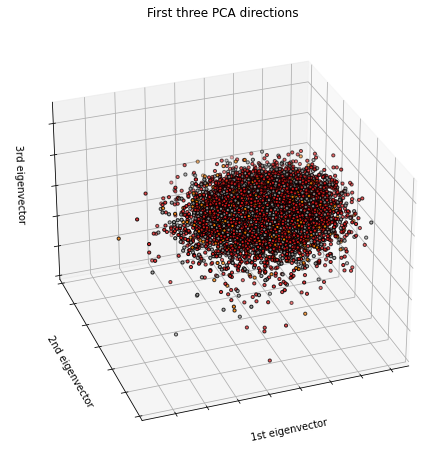

In [98]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder

test_pca = PCA(n_components=3).fit_transform(df)
test_pca = pd.DataFrame(test_pca) 
test_pca["target"] = pd.DataFrame(y_data) 
le = LabelEncoder()
test_pca['target'] = le.fit_transform(list(test_pca['target']))

fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(test_pca[0], test_pca[1], test_pca[2], c=test_pca["target"],
           cmap=plt.cm.Set1, edgecolor='k', s=10)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

In [75]:
test_pca

,0,1,2,target
0,3.572868e-07,-1.575074e-08,-2.370429e-10,0
1,3.572505e-07,-1.578268e-08,-2.295943e-10,0
2,3.572807e-07,-1.575199e-08,-2.347833e-10,0
3,3.572808e-07,-1.575198e-08,-2.347858e-10,0
4,3.572808e-07,-1.575198e-08,-2.347858e-10,0
...,...,...,...,...
9322,3.572808e-07,-1.575198e-08,-2.347858e-10,0
9323,3.572808e-07,-1.575198e-08,-2.347858e-10,0
9324,3.572808e-07,-1.575198e-08,-2.347858e-10,0
9325,3.572808e-07,-1.575198e-08,-2.347858e-10,0


C:\Users\Hyeongbin\AppData\Local\Temp\ipykernel_8168\1460226441.py:5: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


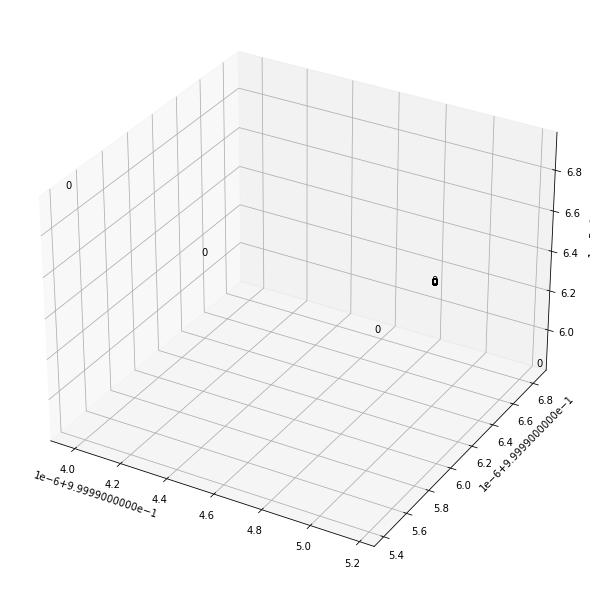

In [60]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 8

fig = plt.figure(1)
ax = Axes3D(fig)

xs = latent_vector[:, 0]
ys = latent_vector[:, 1]
zs = latent_vector[:, 2]

color=['red','green','blue']

for x, y, z, in zip(xs, ys, zs):
    ax.text(x, y, z, 0)
    
ax.set_xlim(xs.min(), xs.max())
ax.set_ylim(ys.min(), ys.max())
ax.set_zlim(zs.min(), zs.max())

plt.show()